In [1]:
import pandas as pd
pd.set_option('display.expand_frame_repr', False)

import matplotlib
import matplotlib.pyplot as plt
font = {'size' : 20}
matplotlib.rc('font', **font)

import seaborn as sns

from pylab import rcParams
rcParams["figure.figsize"] = 30,16

from collections import OrderedDict

import datetime as dt
from datetime import date
from datetime import datetime

import sklearn
from sklearn import metrics
from sklearn.model_selection import KFold

from sklearn.preprocessing import MinMaxScaler
import joblib

import numpy as np
np.random.seed(0)
import scipy

import datetime as dt
from datetime import date

import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, LSTM, Activation, InputLayer
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

import warnings
warnings.filterwarnings("ignore")

import sys
sys.path.insert(0, "../")
import functions

#Funktion für RMSE erstellen
from keras import backend as K
def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

## <font size="7">DENSE-LSTM-1</font><a class="anchor" id="dense-lstm-1"></a>

<font size="5">
Ziel dieses Ansatzes ist es, die Daten vor der Übergabe an die LSTM-Schicht durch eine Dense-Schicht vorzuverarbeiten. Dafür wird eine Dense- und eine LSTM-Schicht á 32 Neuronen trainiert. Das Training erfolgt über 100 Epochen mit 8er Batches und einer Lernrate von 0,0005.
</font>

### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 100
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    model.add(Dense(units=32, activation="tanh"))
    model.add(LSTM(units=32, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.60            1.56               1.79
2             2.21            1.54               1.74
3             2.14            1.47               1.72
4             2.53            1.52               1.82
5             2.21            1.57               1.60
Average       2.34            1.53               1.73





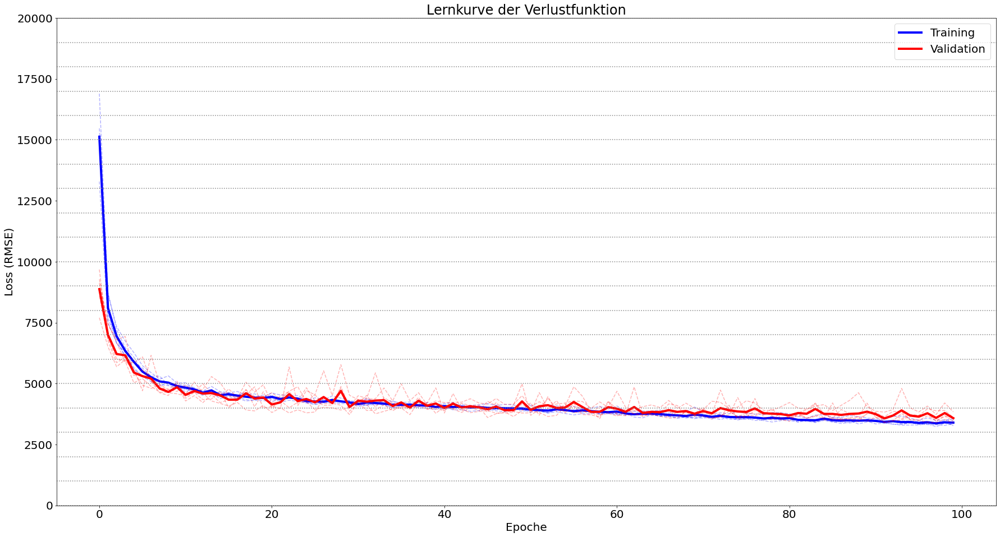

In [8]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 20000)

<font size="5">
Wie schon bei den vorherigen Ansätzen zeigt sich auch hier, dass das Netz sehr schnell anlernt. Setzt die Konvergenz des Modells erst später ein und es sind leichte Überanpassungen erkennbar. Der MAPE ist während der Kreuzvalidierungen allgemein etwas geringer, jedoch zeigt sich auch hier die leichte Anpassung an die Trainingsdaten.
</font>
<br><br>
<font size="5">
Der MAPE auf den Testdaten ist beim finalen Test bereits sehr gut. Die Lernrate scheint allerdings etwas zu hoch zu sein.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/100
273/273 [==============================] - 3s 5ms/step - loss: 0.1117
Epoch 2/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0627
Epoch 3/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0535
Epoch 4/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0481
Epoch 5/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0452
Epoch 6/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0425
Epoch 7/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0403
Epoch 8/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0394
Epoch 9/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0389
Epoch 10/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0381
Epoch 11/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0369
Epoch 12/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0378
Epoch 13/100


       Testdaten Trainingsdaten
R2          0.96           0.98
MAE       3746.0         2346.0
MSE   25569748.0     11722410.0
RMSE      5057.0         3424.0
                               
MAPE      2.28 %         1.46 %


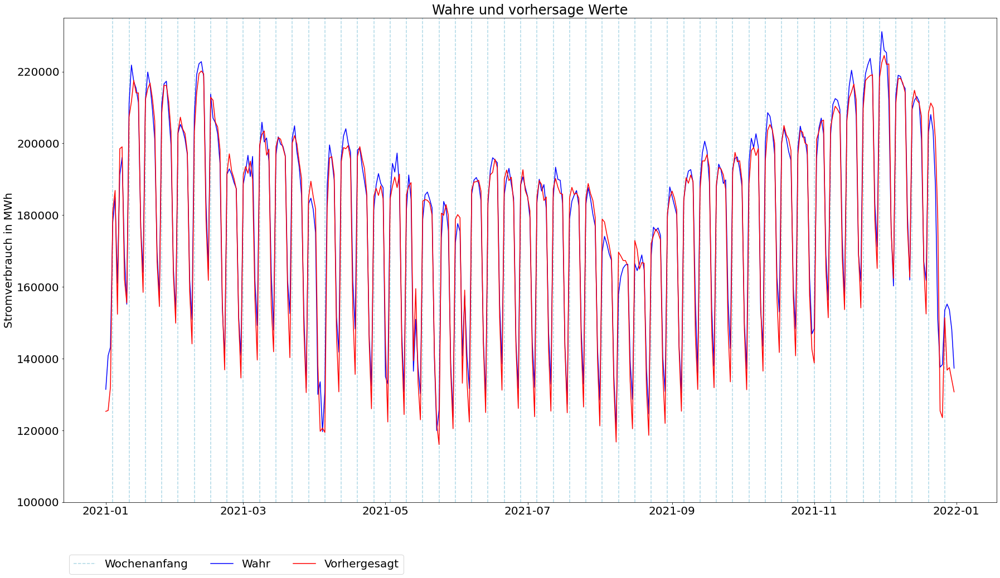

In [7]:
#Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-2</font><a class="anchor" id="dense-lstm-2"></a>

<font size="5">
Da die Lernkurven immer wieder auf eine zu hohe Lernrate hindeuten, wird zunächst eine niedrigere Lernrate getestet, bevor andere Architekturen ausprobiert werden.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 100
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    model.add(Dense(units=32, activation="tanh"))
    model.add(LSTM(units=32, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0001)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.80            2.02               2.13
2             2.58            1.87               1.84
3             2.76            1.97               2.08
4             2.61            1.82               2.01
5             2.31            1.91               1.86
Average       2.61            1.92               1.98





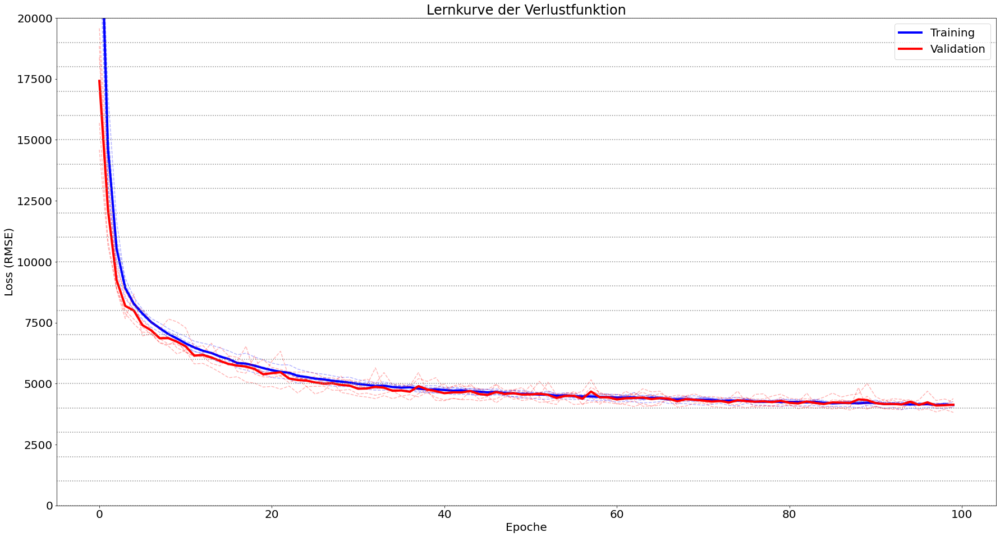

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 20000)

<font size="5">
Es zeigt sich allerdings ein ähnliches Verhalten wie bei den anderen Netzen: Die niedrigere Lernrate ändert nichts am Verhalten des Netzes, es lernt immer noch sehr schnell am Anfang und wird durch weitere Epochen kaum verbessert.
</font>
<br><br>
<font size="5">
Der MAPE fällt bei der niedrigeren Lernrate allerdings ein wenig.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/100
273/273 [==============================] - 3s 4ms/step - loss: 0.2375
Epoch 2/100
273/273 [==============================] - 1s 4ms/step - loss: 0.1197
Epoch 3/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0750
Epoch 4/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0642
Epoch 5/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0595
Epoch 6/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0576
Epoch 7/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0554
Epoch 8/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0530
Epoch 9/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0520
Epoch 10/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0505
Epoch 11/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0491
Epoch 12/100
273/273 [==============================] - 1s 4ms/step - loss: 0.0476
Epoch 13/100


       Testdaten Trainingsdaten
R2          0.96           0.97
MAE       4158.0         2953.0
MSE   30203398.0     20045840.0
RMSE      5496.0         4477.0
                               
MAPE      2.49 %         1.87 %


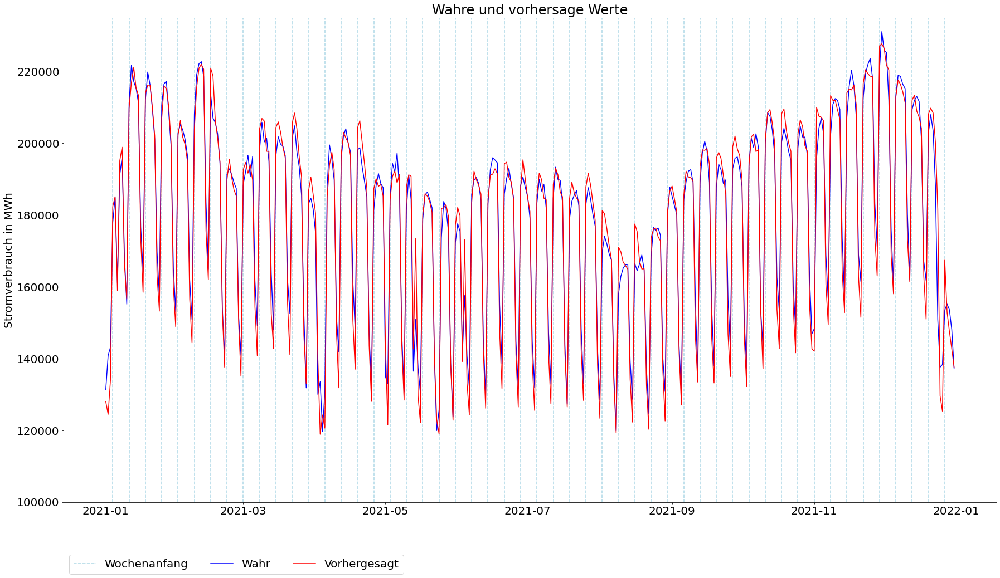

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-3</font><a class="anchor" id="dense-lstm-3"></a>

<font size="5">
Das Netz soll durch zusätzliche Neuronen erweitert werden, um mehr Potenzial für Generalisierungen zu bieten. Außerdem werden die übrigen Trainingsparameter wie bei DENSE-LSTM-1 gewählt.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 100
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    model.add(Dense(units=64, activation="tanh"))
    model.add(LSTM(units=64, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.50            1.33               1.68
2             2.21            1.25               1.67
3             2.35            1.46               1.76
4             2.39            1.35               1.77
5             2.33            1.29               1.51
Average       2.36            1.34               1.68





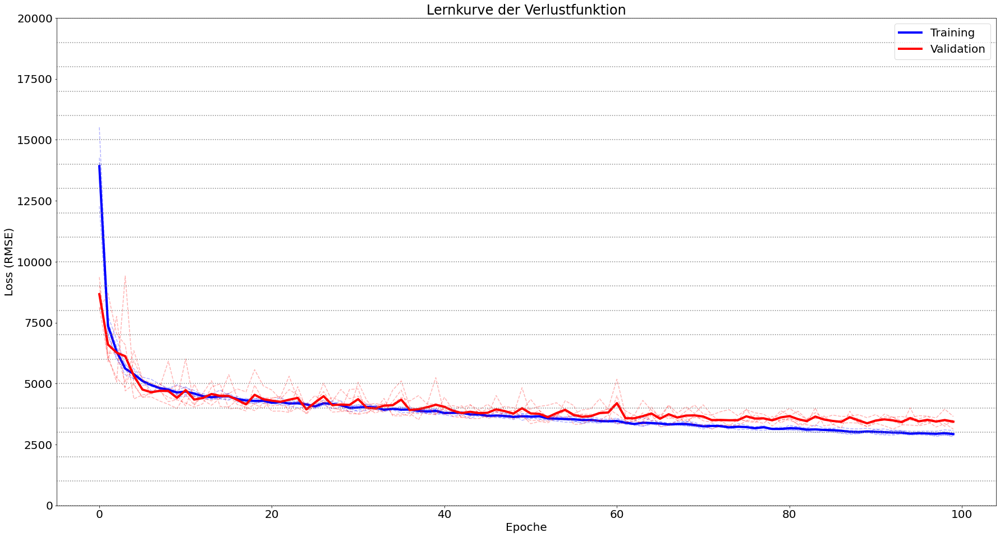

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 20000)

<font size="5">
An der Lernkurve ist erkennbar, dass das Netz zwar immer noch sehr schnell lernt, allerdings beginnt es nach etwa 60 Epochen mit der Konvergenz bei den Testdaten und mit der Überanpassung an die Trainingsdaten. Hier könnten Dropouts oder Regularisierungen möglicherweise zu Verbesserungen führen.
</font>
<br><br>
<font size="5">
Der MAPE verbessert sich auf den Testdaten auf 2,15% und auf den Trainingsdaten auf 1,33%. Es liegt also eine Überanpassung vor, allerdings führen die zusätzlichen Neuronen zu einer erkennbaren Verbesserung.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/100
273/273 [==============================] - 3s 5ms/step - loss: 0.0973
Epoch 2/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0524
Epoch 3/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0457
Epoch 4/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0413
Epoch 5/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0402
Epoch 6/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0393
Epoch 7/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0359
Epoch 8/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0359
Epoch 9/100
273/273 [==============================] - 2s 5ms/step - loss: 0.0354
Epoch 10/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0352
Epoch 11/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0344
Epoch 12/100
273/273 [==============================] - 1s 5ms/step - loss: 0.0344
Epoch 13/100


       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3578.0         2148.0
MSE   23172917.0      9560099.0
RMSE      4814.0         3092.0
                               
MAPE      2.15 %         1.33 %


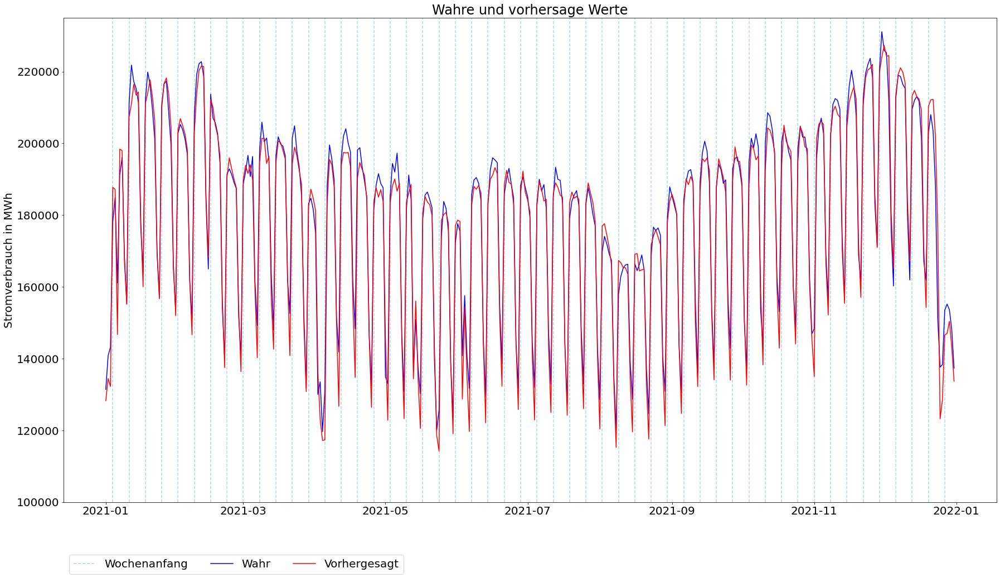

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-4</font><a class="anchor" id="dense-lstm-4"></a>

<font size="5">
Aufgrund der Verbesserung des Netzes durch mehr Neuronen im letzten Versuch wird nun probiert, das Netz durch noch mehr Neuronen zu verbessern.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    model.add(Dense(units=64, activation="tanh"))
    model.add(LSTM(units=128, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.13            1.25               1.79
2             2.32            1.06               1.70
3             2.30            1.06               1.70
4             2.30            1.06               1.68
5             2.20            1.04               1.64
Average       2.25            1.09               1.70





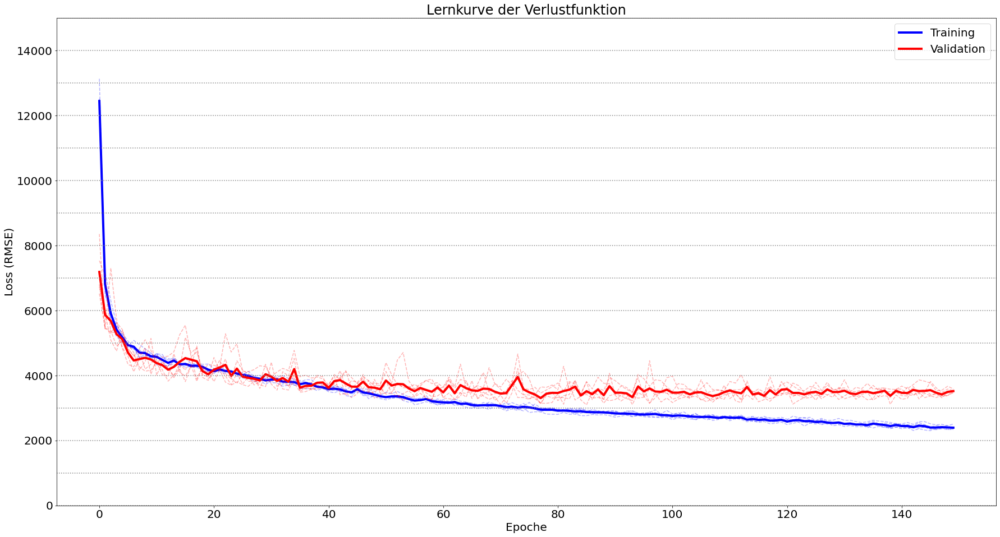

In [9]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 15000)

<font size="5">
An der Lernkurve ist wie auch im letzten Versuch zu erkennen, dass die Überanpassungen ab etwa 60 Epochen eintreten, gleichzeitig konvergiert das Modell auf den Testdaten. Da das Netz gute Werte beim MAPE erreicht, sollte nun versucht werden, das Netz beziehungsweise das Training robuster gegen Überanpassungen zu machen.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 7ms/step - loss: 0.0810
Epoch 2/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0469
Epoch 3/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0423
Epoch 4/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0398
Epoch 5/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0387
Epoch 6/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0374
Epoch 7/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0356
Epoch 8/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0352
Epoch 9/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0341
Epoch 10/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0336
Epoch 11/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0331
Epoch 12/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0337
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.96           0.99
MAE       3985.0         1851.0
MSE   27016737.0      6543172.0
RMSE      5198.0         2558.0
                               
MAPE      2.33 %         1.12 %


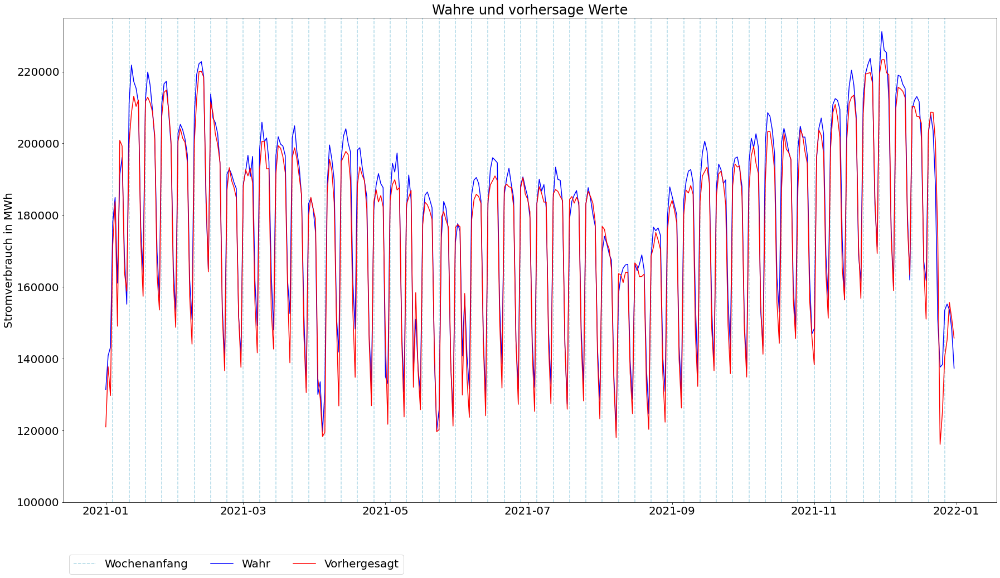

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-5</font><a class="anchor" id="dense-lstm-5"></a>

<font size="5">
Das Netz ist mit 64 und 128 Neuronen in den beiden Schichten bereits sehr groß. Da bereits gute Ergebnisse erzielt werden, wird von zusätzlichen Vergrößerungen abgesehen. Stattdessen wird nun versucht, die Überanpassung ab der etwa 60. Epoche durch Regularisierung zu beheben. Dafür wird zunächst die Anzahl der Epochen von 150 auf 100 gesenkt und eine L2-Regularisierung von 0,0001 in beide Schichten eingefügt.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 100
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="tanh"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.40            1.34               1.71
2             2.38            1.42               1.70
3             2.17            1.51               1.87
4             2.39            1.38               1.82
5             2.21            1.43               1.66
Average       2.31            1.42               1.75





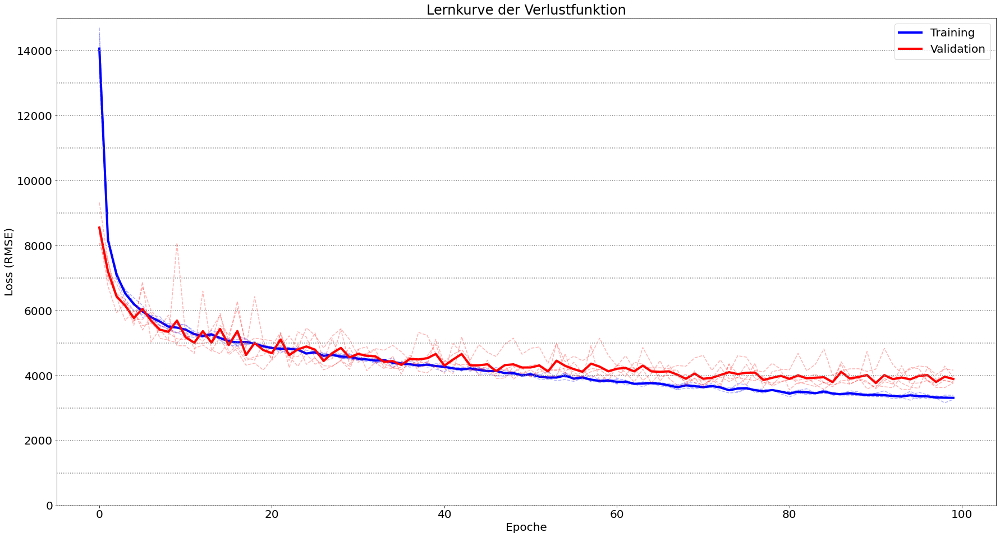

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 15000)

<font size="5">
Das Netz neigt immer noch zu Überanpassungen ab etwa der 60. Epoche. Allerdings scheint die Konvergenz etwas später bei 100 Epochen einzusetzen.
</font>
<br><br>
<font size="5">
Der MAPE verbessert sich auf den Testdaten auf 2,17%, auf den Trainingsdaten erreicht er 1,34%. Die Werte stimmen in etwa mit denen aus der Kreuzvalidierung überein. Durch die Regularisierung konnte das Netz also etwas besser generalisieren.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/100
273/273 [==============================] - 3s 6ms/step - loss: 0.1075
Epoch 2/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0601
Epoch 3/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0535
Epoch 4/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0500
Epoch 5/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0458
Epoch 6/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0470
Epoch 7/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0426
Epoch 8/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0420
Epoch 9/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0433
Epoch 10/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0406
Epoch 11/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0411
Epoch 12/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0393
Epoch 13/100


       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3563.0         2199.0
MSE   23330996.0      9514037.0
RMSE      4830.0         3084.0
                               
MAPE      2.17 %         1.34 %


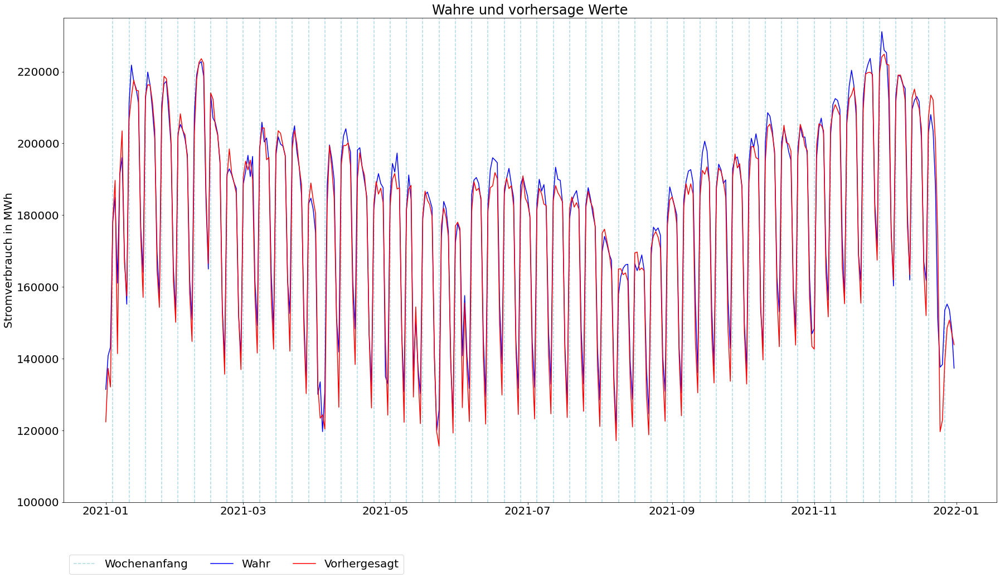

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-6</font><a class="anchor" id="dense-lstm-6"></a>

<font size="5">
Da eine leichte Regularisierung das Netz verbessert hat, wird eine etwas größere Regularisierung von 0,001 angewandt.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="tanh"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.19            1.41               1.74
2             2.25            1.47               1.68
3             2.53            1.52               1.86
4             2.18            1.34               1.76
5             2.15            1.53               1.67
Average       2.26            1.45               1.74





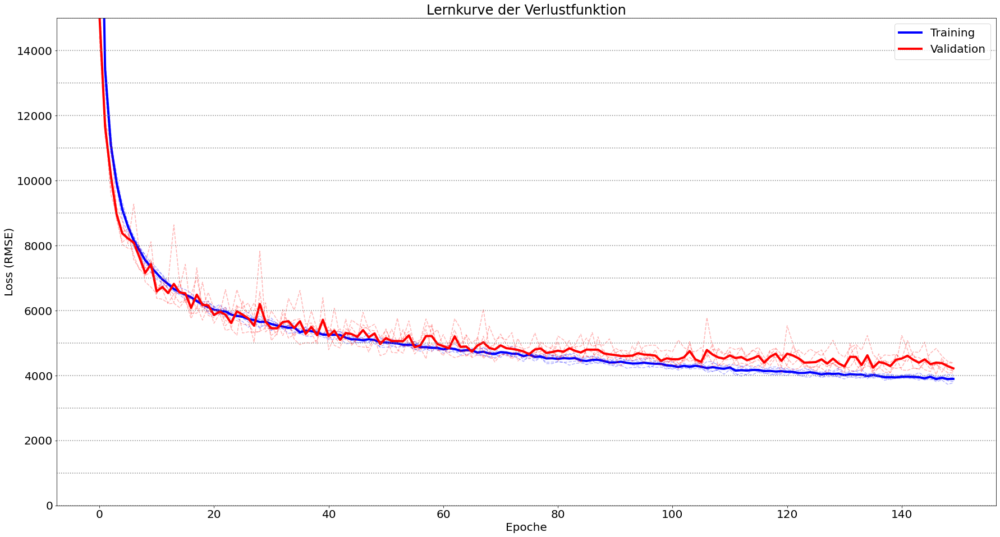

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 15000)

<font size="5">
Während der Kreuzvalidierungen verhält sich das Modell ähnlich, beim finalen Test kommt es allerdings zu stärkeren Abweichungen als bei dem Modell mit einer niedrigeren Regularisierung. Mit 0,001 ist die Regularisierungsstärke also vermutlich etwas zu hoch gewählt.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 6ms/step - loss: 0.1759
Epoch 2/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0957
Epoch 3/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0812
Epoch 4/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0710
Epoch 5/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0666
Epoch 6/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0638
Epoch 7/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0605
Epoch 8/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0565
Epoch 9/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0563
Epoch 10/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0534
Epoch 11/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0536
Epoch 12/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0512
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.96           0.99
MAE       4100.0         2408.0
MSE   29626221.0     10677615.0
RMSE      5443.0         3268.0
                               
MAPE      2.48 %         1.47 %


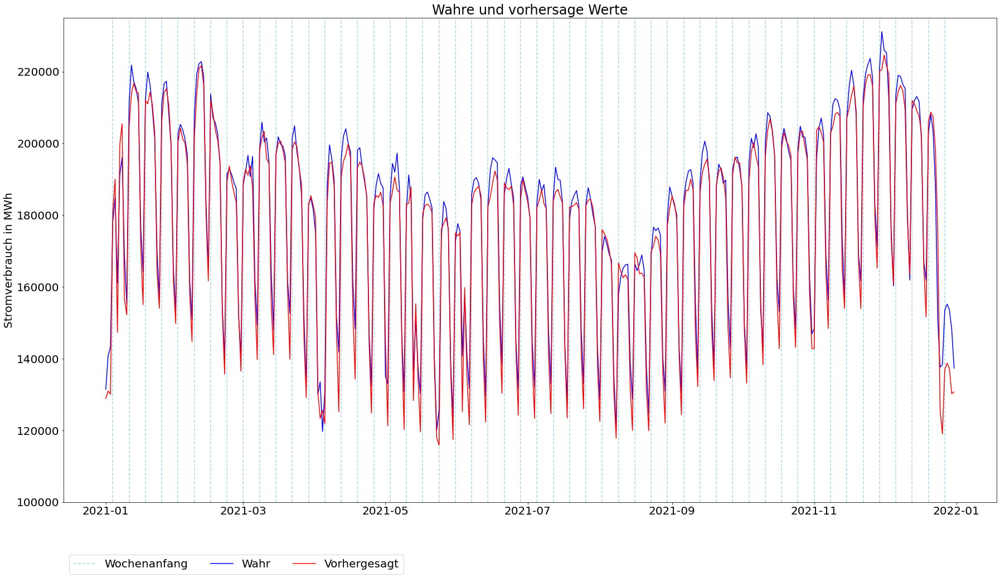

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-7</font><a class="anchor" id="dense-lstm-7"></a>

<font size="5">
Da die Regularisierungsstärke mit 0,0001 angemessen scheint, wird im Folgenden ein leichter Dropout von 5% zwischen den Schichten als Alternative zu einer größeren Regularisierung eingesetzt, um die Überanpassungen zu vermeiden.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="tanh"))
    model.add(Dropout(0.05))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.53            1.30               1.60
2             2.25            1.34               1.74
3             2.22            1.21               1.67
4             2.29            1.26               1.81
5             2.45            1.34               1.69
Average       2.35            1.29               1.70





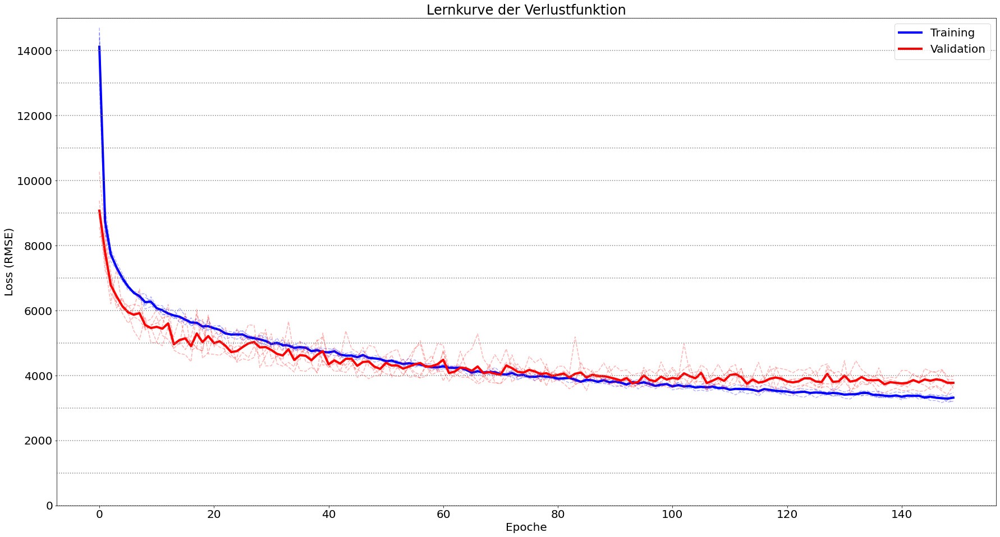

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 15000)

<font size="5">
Der Dropout stört den Anlernprozess zwar nicht so stark wie eine stärkere Regularisierung von 0,001, allerdings lässt sich die Überanpassung dadurch auch nicht reduzieren. Da es im Vergleich zu DENSE-LSTM jedoch zu leicht schlechteren Vorhersagen kommt (MAPE fällt von 2,17% auf 2,35%), wird von einem weiteren Einsatz des Dropouts abgesehen.
</font>


### <font size="5">Test</font>

In [8]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 7ms/step - loss: 0.1047
Epoch 2/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0632
Epoch 3/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0557
Epoch 4/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0544
Epoch 5/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0530
Epoch 6/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0501
Epoch 7/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0496
Epoch 8/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0471
Epoch 9/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0472
Epoch 10/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0462
Epoch 11/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0454
Epoch 12/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0445
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.96           0.99
MAE       3854.0         2036.0
MSE   28765671.0      7963828.0
RMSE      5363.0         2822.0
                               
MAPE      2.35 %         1.25 %


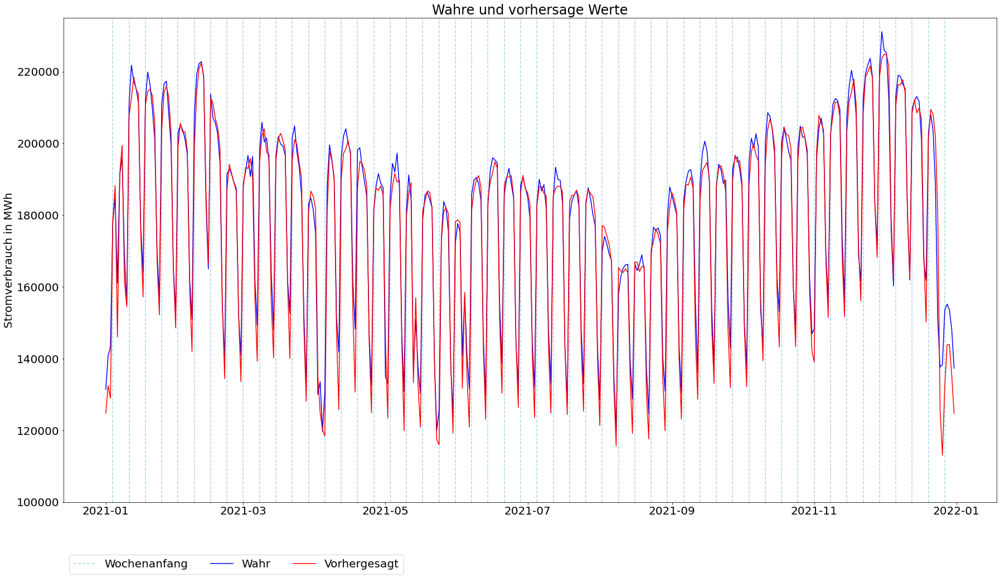

In [9]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-8</font><a class="anchor" id="dense-lstm-8"></a>

<font size="5">
Da die ReLu bei etwas tieferen Netzen das Problem der verschwindenden Gradienten kompensieren kann, wird die tanh-Funktion testweise durch die ReLu ersetzt.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="relu"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.00            1.20               1.58
2             2.24            1.11               1.54
3             2.69            1.52               1.78
4             2.02            1.23               1.83
5             2.30            1.21               1.59
Average       2.25            1.25               1.66





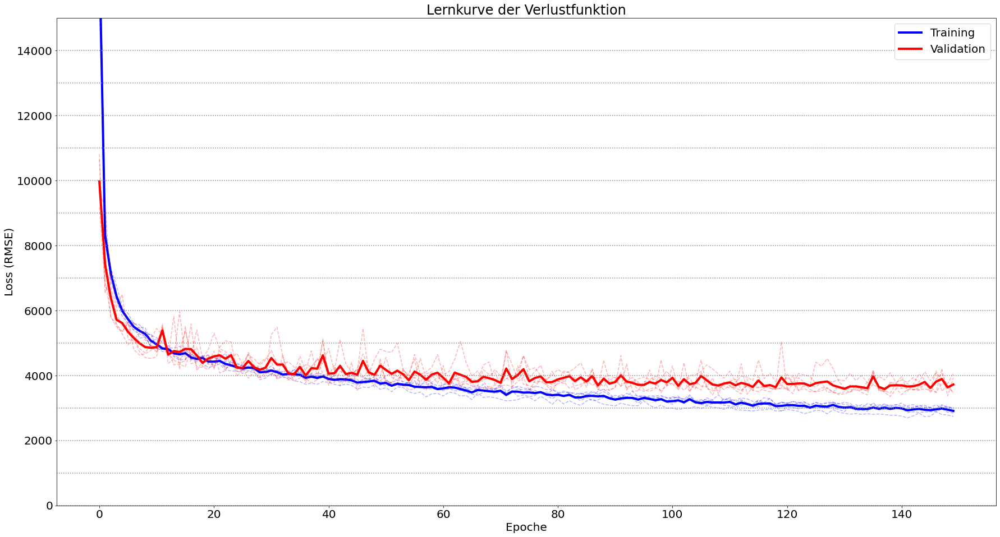

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 15000)

<font size="5">
Mit der ReLu-Funktion in beiden Schichten lässt sich keine wirklice Verbesserung erzielen, der MAPE ist fast gleich wie bei den vorherigen Netzen und auch das Training verläuft sehr ähnlich.
</font>


### <font size="5">Test</font>

In [14]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 7ms/step - loss: 0.1169
Epoch 2/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0592
Epoch 3/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0500
Epoch 4/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0458
Epoch 5/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0436
Epoch 6/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0427
Epoch 7/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0412
Epoch 8/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0405
Epoch 9/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0391
Epoch 10/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0374
Epoch 11/150
273/273 [==============================] - 2s 8ms/step - loss: 0.0377
Epoch 12/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0364
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.96           0.99
MAE       3919.0         2110.0
MSE   26341434.0      8257872.0
RMSE      5132.0         2874.0
                               
MAPE      2.35 %         1.28 %


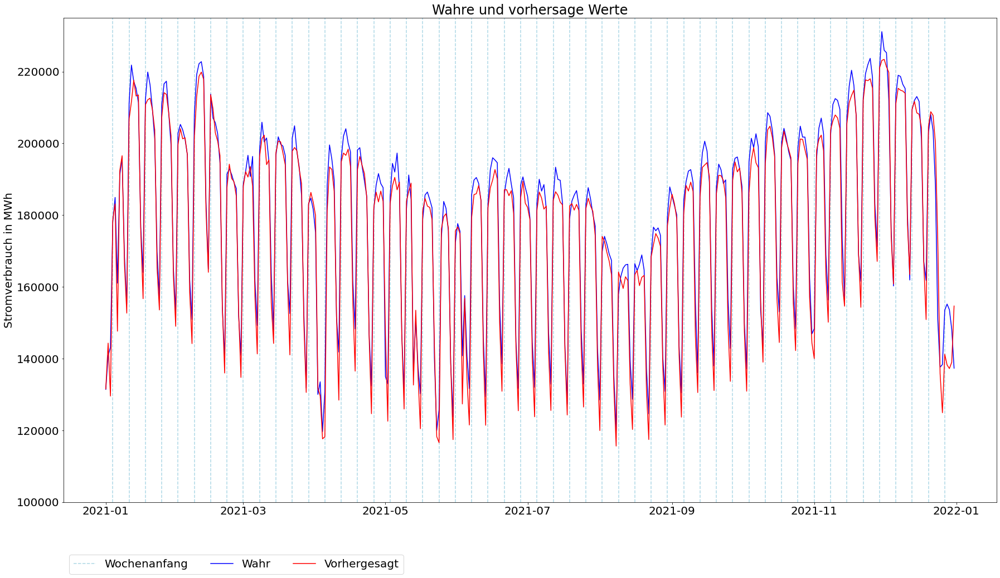

In [15]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-9</font><a class="anchor" id="dense-lstm-9"></a>

<font size="5">
Da sich tanh bei LSTM bewährt hat, wird ebenfalls getestet, wie sich das Netz mit der ReLu-Funktion zur Aktivierung in der Dense-Schicht verhält, wenn bei LSTM weiterhin tanh eingesetzt wird.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.15            1.29               1.59
2             2.32            1.43               1.72
3             2.09            1.37               1.74
4             2.15            1.25               1.69
5             2.27            1.36               1.64
Average       2.20            1.34               1.68





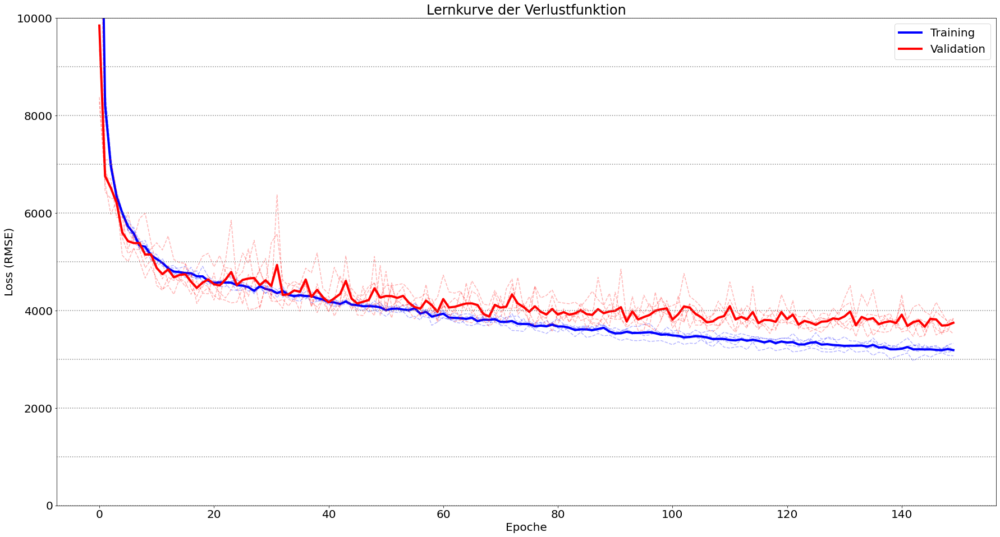

In [8]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Die Lernkurve verhält sich zwar immer noch nach dem bereits beschriebenen Muster, allerdings setzt die Konvergenz jetzt etwas später ein. Von einem noch längeren Training wird allerdings abgesehen, dass es ab der 60. Epoche bereits zu Überanpassungen kommt, welche sich bisher nicht beheben ließen.
</font>
<br><br>
<font size="5">
Beim MAPE zeigt sich allerdings eine deutliche Verbesserung auf den Testdaten (von 2,17% bei DENSE-LSTM-5 auf 1,99%), bei den Trainingsdaten verhält sich das Modell aber ähnlich (1,34% bei DENSE-LSTM-5 und 1,35% hier). Das Modell scheint also besser generalisieren zu können, wenn die ReLu in der Dense-Schicht verwendet wird.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 6ms/step - loss: 0.1225
Epoch 2/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0611
Epoch 3/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0520
Epoch 4/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0467
Epoch 5/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0450
Epoch 6/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0424
Epoch 7/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0416
Epoch 8/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0403
Epoch 9/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0386
Epoch 10/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0371A: 0s -
Epoch 11/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0368
Epoch 12/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0378
Epoch 

       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3361.0         2162.0
MSE   19894608.0      9401244.0
RMSE      4460.0         3066.0
                               
MAPE      1.99 %         1.35 %


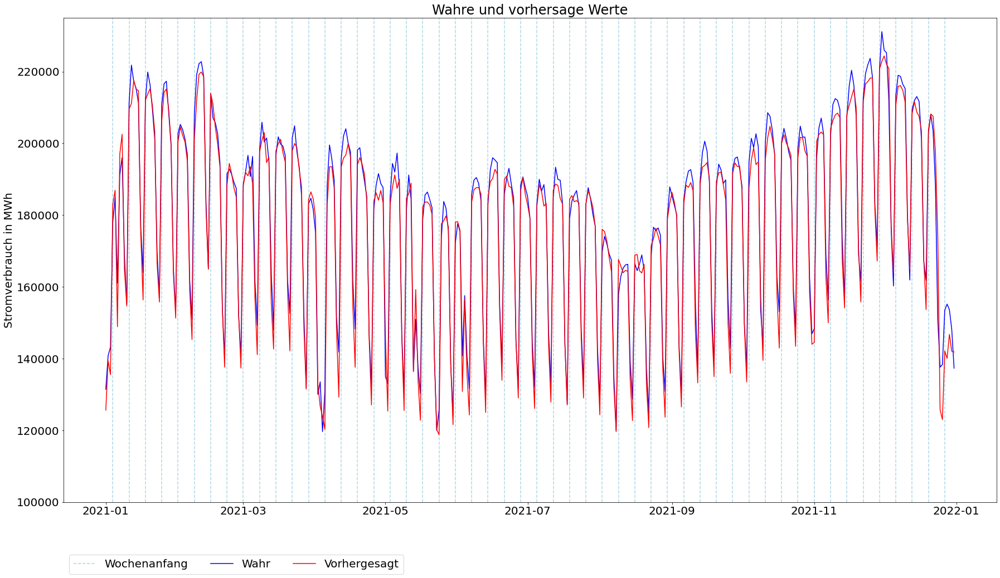

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-10</font><a class="anchor" id="dense-lstm-10"></a>

<font size="5">
Es wird nun probiert, die Lernrate von 0,0005 auf 0,001 und gleichzeitig die Regularisierung von 0,0001 auf 0,001 zu erhöhen, um die Überanpassungen beim langen Training zu verhindern.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.001)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.15            1.41               1.61
2             2.23            1.42               1.71
3             2.37            1.57               1.77
4             2.13            1.37               1.68
5             2.68            1.46               1.60
Average       2.31            1.45               1.67





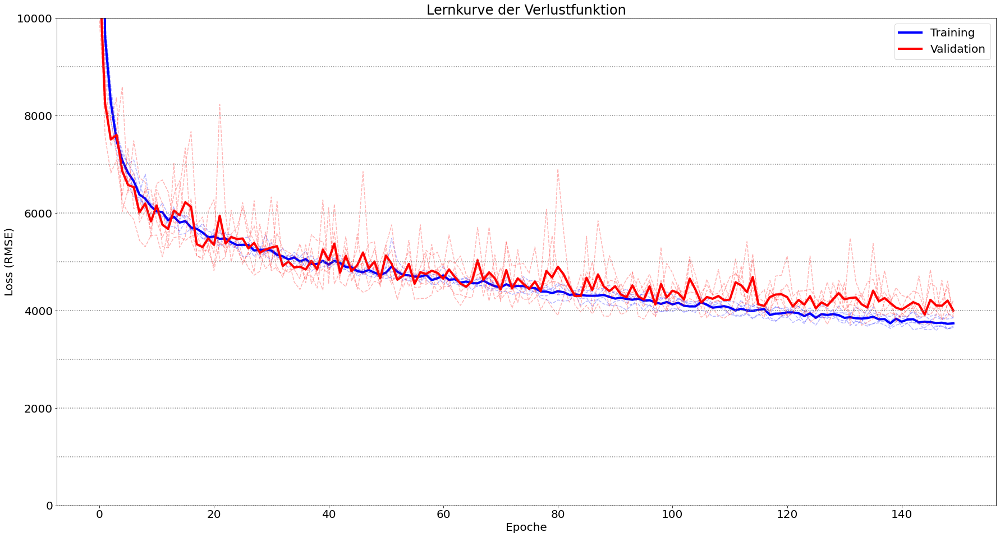

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Die Änderungen haben im Vergleich zu DENSE-LSTM-10 allerdings keine Veränderung beim Training oder den Ergebnissen geführt.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 6ms/step - loss: 0.1323
Epoch 2/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0726
Epoch 3/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0624
Epoch 4/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0585
Epoch 5/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0538
Epoch 6/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0520
Epoch 7/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0520
Epoch 8/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0498
Epoch 9/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0483
Epoch 10/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0472
Epoch 11/150
273/273 [==============================] - 2s 7ms/step - loss: 0.0462
Epoch 12/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0448
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3436.0         2179.0
MSE   22355235.0      9486521.0
RMSE      4728.0         3080.0
                               
MAPE      2.06 %         1.36 %


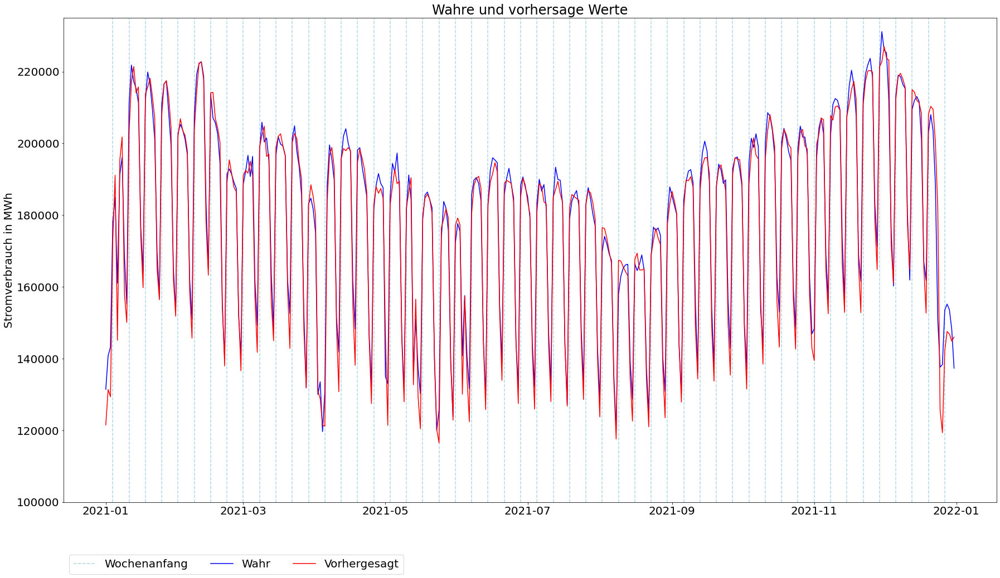

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-11</font><a class="anchor" id="dense-lstm-11"></a>

<font size="5">
Es wird weiterhin überprüft, ob das Modell aufgrund der geringen Batchgröße möglicherweise das globale Minimum der Verlustfunktion nicht erreichen kann. Daher wird die Batchgröße auf von 8 auf 16 erhöht.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 16

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.001)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.43            1.44               1.72
2             2.35            1.43               1.62
3             2.14            1.43               1.65
4             2.55            1.51               1.76
5             2.30            1.56               1.65
Average       2.35            1.47               1.68





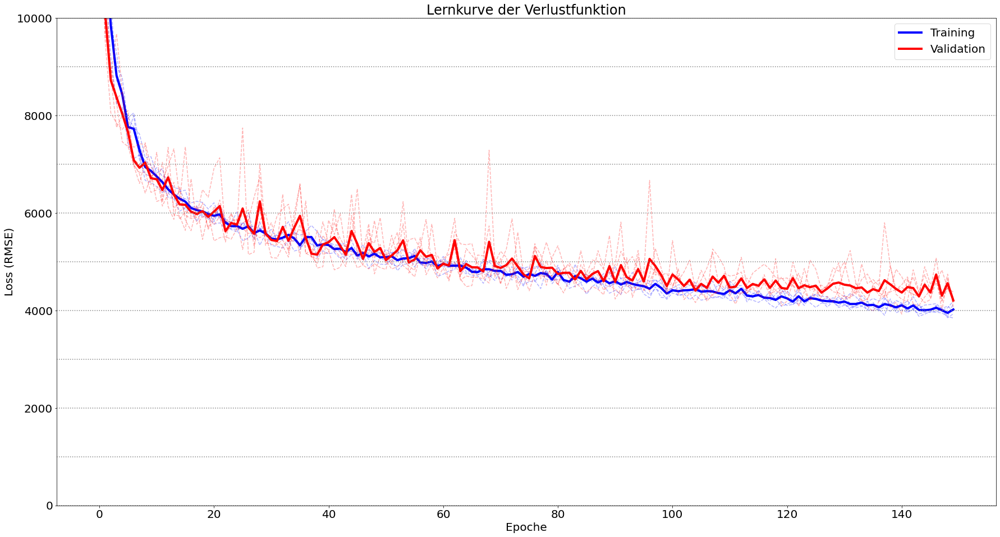

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Die Verlustfunktion läuft sehr ähnlich, beim finalen Test kommt es allerdings wieder zu einer sichtlichen Verschlechterung des MAPE auf 2,33%. Die Batchgröße ist also angemessen gewählt.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
137/137 [==============================] - 2s 7ms/step - loss: 0.1654
Epoch 2/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0818
Epoch 3/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0712
Epoch 4/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0649
Epoch 5/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0615
Epoch 6/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0577
Epoch 7/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0553
Epoch 8/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0548
Epoch 9/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0522
Epoch 10/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0500
Epoch 11/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0493
Epoch 12/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0487
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.96           0.98
MAE       3886.0         2444.0
MSE   25773625.0     11873163.0
RMSE      5077.0         3446.0
                               
MAPE      2.33 %         1.49 %


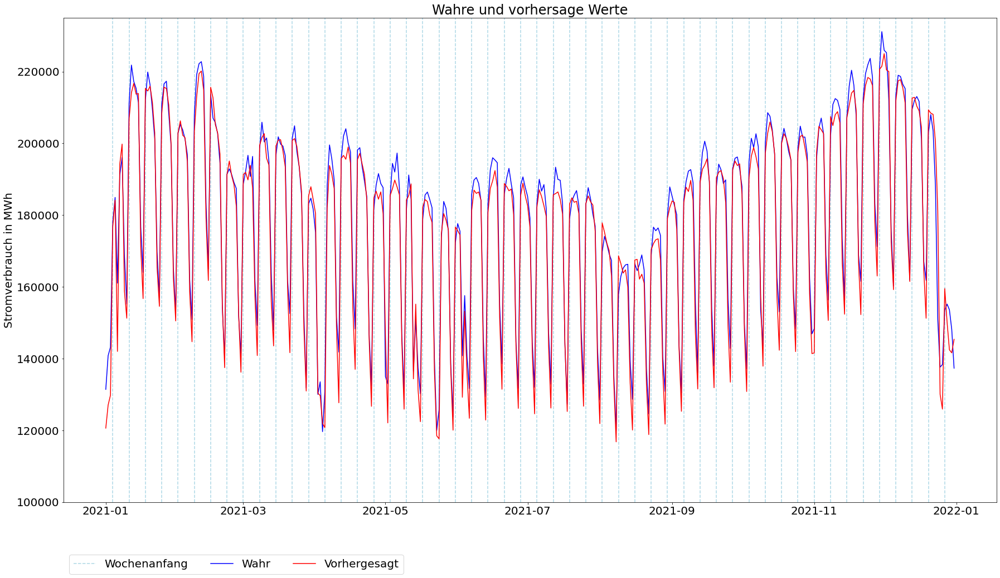

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-12</font><a class="anchor" id="dense-lstm-12"></a>

<font size="5">
Mit DENSE-LSTM-9 ließen sich bereits gute Ergebnisse erzielen. Es wird nun geprüft, ob sich die Überanpassungen durch kleine Dropouts verhindern lassen.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 16

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(Dropout(0.05))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.62            1.49               1.71
2             2.55            1.50               1.80
3             2.81            1.54               1.71
4             2.30            1.46               1.90
5             2.59            1.58               1.68
Average       2.57            1.51               1.76





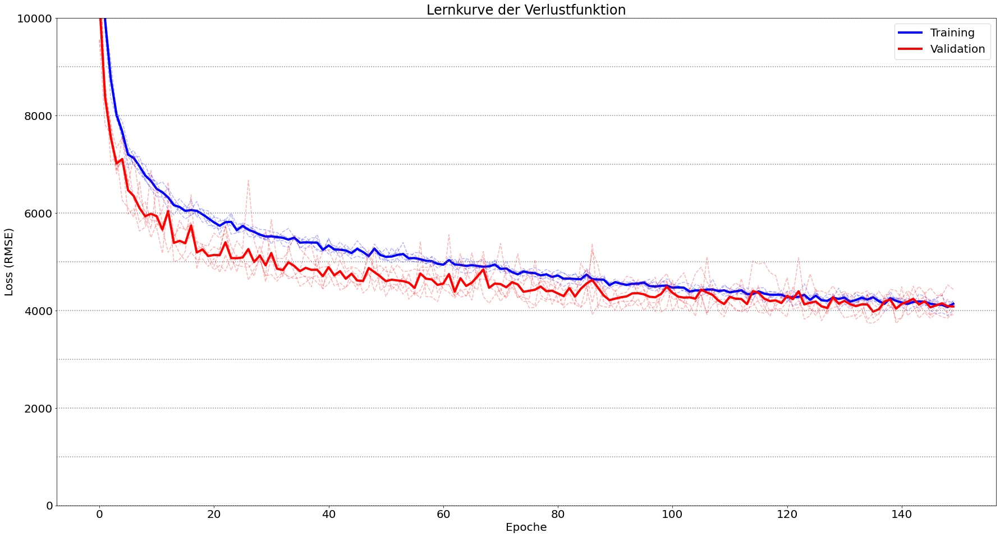

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Es zeigt sich allerdings erneut, dass selbst kleinste Dropouts von gerade einmal 5% sofort zu einer Unteranpassung führen, da der MAPE bei den Testdaten sehr stark auf 2,33% fällt. Die Trainingsdaten werden mit einem MAPE von 1,6% ebenfalls schlechter erkannt. Der Einsatz von Dropouts ist also nicht förderlich für das Modell.
</font>


### <font size="5">Test</font>

In [ ]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
137/137 [==============================] - 3s 8ms/step - loss: 0.1438
Epoch 2/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0726
Epoch 3/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0634
Epoch 4/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0589
Epoch 5/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0540
Epoch 6/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0518
Epoch 7/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0511
Epoch 8/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0504
Epoch 9/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0508
Epoch 10/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0494
Epoch 11/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0468
Epoch 12/150
137/137 [==============================] - 1s 7ms/step - loss: 0.0484
Epoch 13/150


In [ ]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-13</font><a class="anchor" id="dense-lstm-13"></a>

<font size="5">
Die Lernrate wird im Vergleich zu DENSE-LSTM-9 etwas erhöht, da das Netz immer noch in den frühen Epochen sehr schnell und in späten Epochen sehr wenig lernt. 
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.001)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.06            1.34               1.56
2             2.61            1.41               1.70
3             2.14            1.24               1.59
4             2.52            1.25               1.66
5             2.20            1.33               1.61
Average       2.31            1.31               1.62





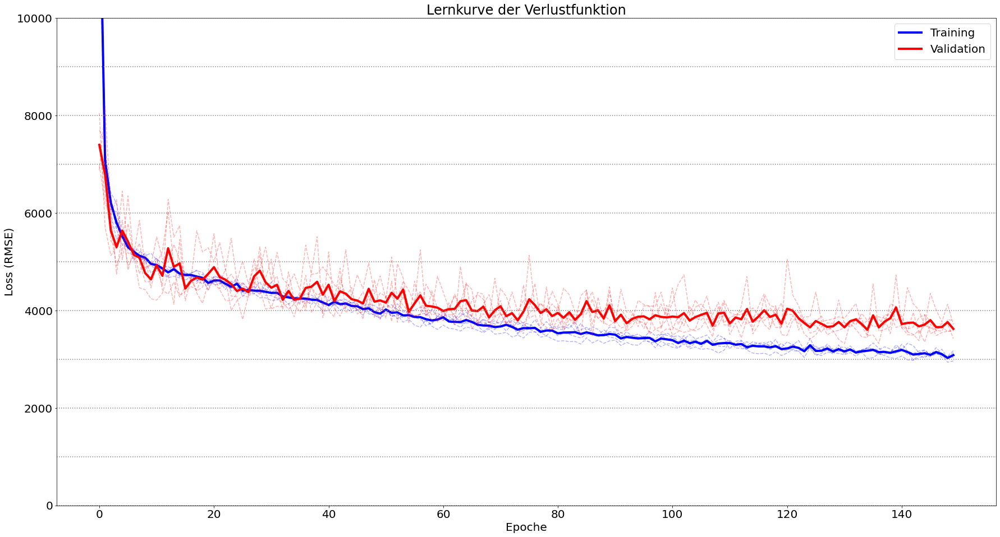

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Das Modell erzielt ähnliche Ergebnisse, am Verlauf der Lernkurve lässt sich durch die Lernrate nichts ändern.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
273/273 [==============================] - 3s 6ms/step - loss: 0.0892
Epoch 2/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0534
Epoch 3/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0467
Epoch 4/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0427
Epoch 5/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0422
Epoch 6/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0401
Epoch 7/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0391
Epoch 8/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0394
Epoch 9/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0387
Epoch 10/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0379
Epoch 11/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0377
Epoch 12/150
273/273 [==============================] - 2s 6ms/step - loss: 0.0374
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3315.0         2170.0
MSE   21175076.0      8711605.0
RMSE      4602.0         2952.0
                               
MAPE      1.99 %         1.34 %


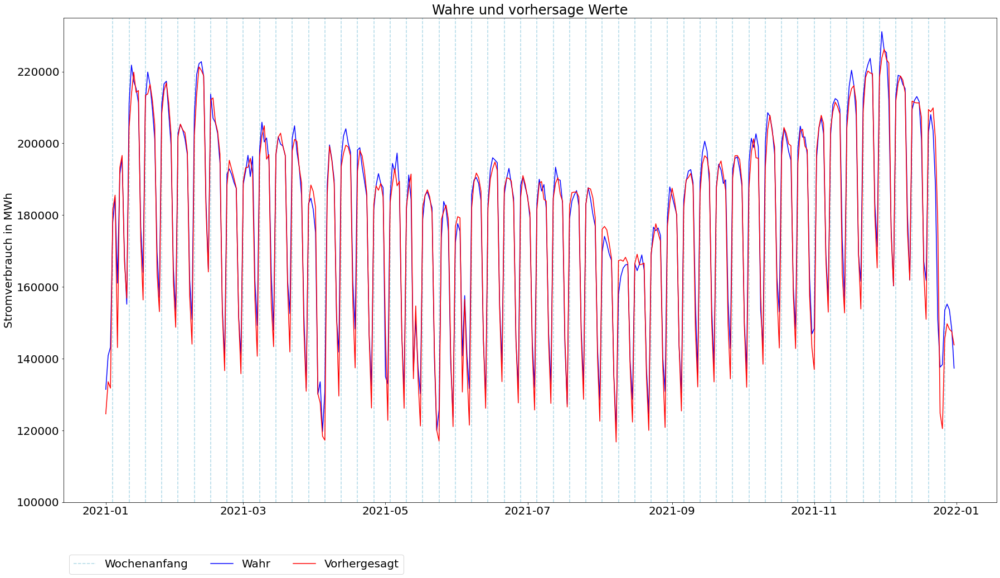

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-14</font><a class="anchor" id="dense-lstm-14"></a>

<font size="5">
Wie auch bei den LSTM-DENSE-Modellen wird die Fenstergröße untersucht. Dafür wird zunächst ein kleineres Fenster der Länge 7 ausprobiert.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 7

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.23            1.39               1.51
2             2.33            1.29               1.55
3             2.50            1.44               1.82
4             2.31            1.40               1.84
5             2.27            1.29               1.66
Average       2.33            1.36               1.68





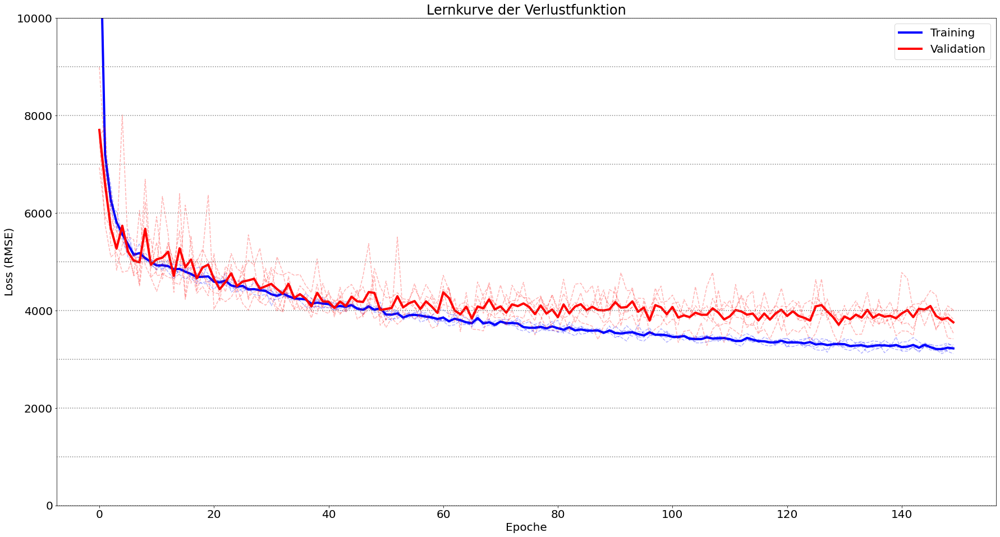

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Das kürzere Fenster führt zu einer leichten Unteranpassung, ansonsten ändert sich am Verhalten des Modells so gut wie gar nichts. 
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
274/274 [==============================] - 2s 4ms/step - loss: 0.0933
Epoch 2/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0536
Epoch 3/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0473
Epoch 4/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0433
Epoch 5/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0413
Epoch 6/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0414
Epoch 7/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0408
Epoch 8/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0399
Epoch 9/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0401
Epoch 10/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0391
Epoch 11/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0394
Epoch 12/150
274/274 [==============================] - 1s 4ms/step - loss: 0.0388
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.96           0.99
MAE       3557.0         2134.0
MSE   24615912.0      8793555.0
RMSE      4961.0         2965.0
                               
MAPE      2.15 %         1.31 %


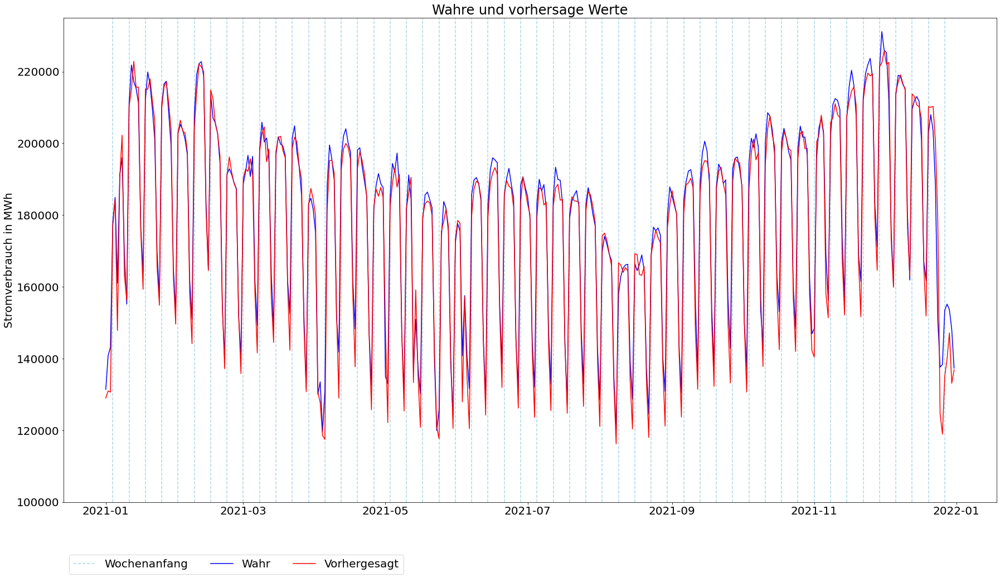

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-15</font><a class="anchor" id="dense-lstm-15"></a>

<font size="5">
Neben einem verkürzten Fenster wird auch ein längeres Fenster mit 21 Zeitschritten verwendet.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 150
batch_size = 8

window_size = 21

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.26            1.14               1.61
2             2.03            1.18               1.48
3             2.37            1.33               1.80
4             2.98            1.35               1.98
5             2.03            1.21               1.59
Average       2.33            1.24               1.69





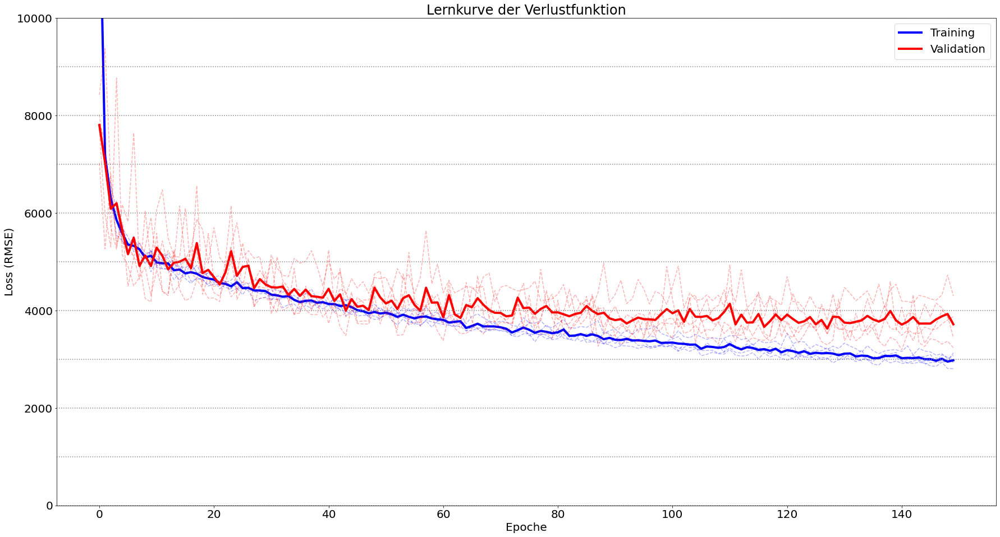

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Das längere Fenster führt zu einer leichten Verschlechterung auf den Testdaten und einer Verbesserung auf den Trainingsdaten. Wenn die Fensterlänge erweitert wird, scheint es also eher zu Überanpassungen an die Trainingsdaten zu kommen. Die Fensterlänge von 14 ist also angemessen.
</font>


### <font size="5">Test</font>

In [6]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/150
272/272 [==============================] - 4s 9ms/step - loss: 0.0949
Epoch 2/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0509
Epoch 3/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0469
Epoch 4/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0440
Epoch 5/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0423
Epoch 6/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0397
Epoch 7/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0400
Epoch 8/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0393
Epoch 9/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0381
Epoch 10/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0378
Epoch 11/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0370
Epoch 12/150
272/272 [==============================] - 2s 9ms/step - loss: 0.0376
Epoch 13/150


       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3623.0         2037.0
MSE   24277651.0      8106864.0
RMSE      4927.0         2847.0
                               
MAPE      2.22 %         1.26 %


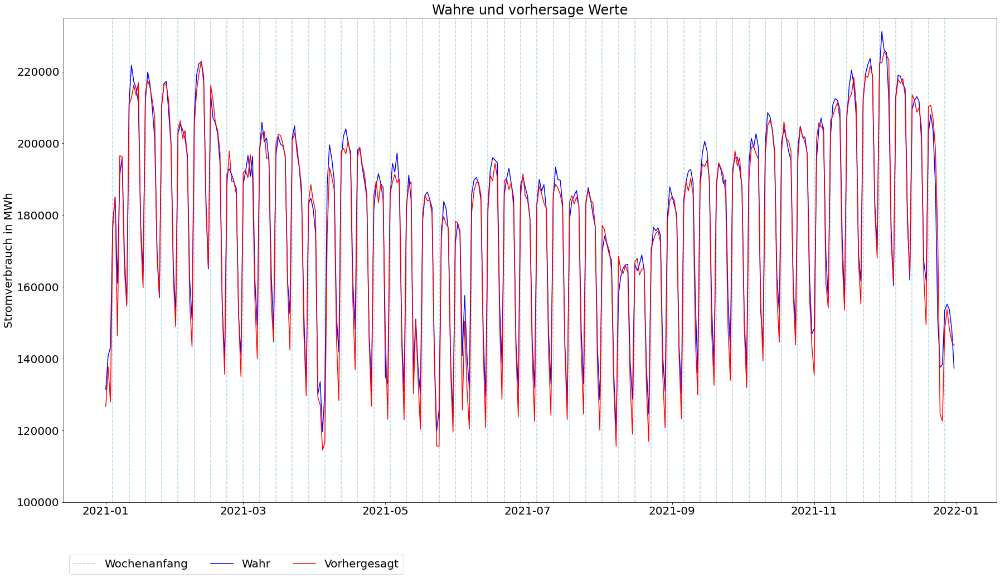

In [7]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

## <font size="7">DENSE-LSTM-16</font><a class="anchor" id="dense-lstm-16"></a>

<font size="5">
Das Netz lässt sich theoretisch endlos erweitern oder optimieren. Es könnten weitere Schichten, mehr Neuronen, andere Arten von Schichten und Aktivierungsfunktionen etc. eingesetzt werden. Auch die Hyperparameter des Trainings könnten noch verändert werden. Da aber unmöglich alle denkbaren Kombinationen von Architekturen und Parametern ausprobiert werden können, wird das Netz nur näherungsweise optimiert. Folgende Erkenntnisse wurden während des Modeling gewonnen:
<br>1. Das Netz erzielt mit einer Dense-Schicht á 64 und einer LSTM-Schicht á 128 Neuronen sehr gute Ergebnisse
<br>2. Als Aktivierungsfunktion für die Dense-Schicht bietet sich die ReLu-Funktion an, in der LSTM-Schicht wird tanh verwendet.
<br>3. Die Fensterlänge ist mit 14 Zeitschritten angemessen. Kleinere Fenster führen zu Unteranpassungen, größere Fenster führen zu Überanpassungen und sehr viel komplexeren Modellen.
<br>4. Als Lernrate bietet sich 0,0005 in Verbindung mit einer Batchgröße von 8 an. Größere Batches führen nicht dazu, dass das Minimum der Verlustfunktion besser erreicht werden kann. Die Netze lernen zwar in frühen Epochen schnell an, allerdings haben weitere Epochen bei einer derart niedrigen Lernrate immer noch positive Effekte.
<br>5. Das Training erfolgt über 100 Epochen, da hier die Konvergenz des Modells auf den Test- beziehungsweise Validierungsdaten einsetzt.
<br>6. Ab etwa der 60. Epoche kommt es zu leichten Überanpassungen an die Trainingsdaten. Diese lassen sich durch eine L2-Regularisierung mit einer Stärke von 0,0001 teilweise beheben. Höhere Regularisierungsstärken frühen zu Unteranpassungen, da der Lernprozess zu stark gestört wird. Selbst kleine Dropouts führen zu starken Unteranpassungen und lassen sich daher nicht für das Modell verwenden.
<br><br>Es wird als ein zweischichtiges Netz aus einer Dense-Schicht á 64 und einer LSTM-Schicht á 128 Neuronen trainiert. Die Dense-Schicht wird mit der ReLu-Funktion, die LSTM-Schicht mit tanh aktiviert. Für die LSTM-Schicht wird eine Fenster über 14 Zeitschritte verwendet. Das Training erfolgt über 100 Epochen mit Batches der Größe 8 und einer Regularisierung von 0,0001.
</font>


### <font size="5">Modell und Parameter</font>

In [2]:
#Hyperparameter
epochs = 100
batch_size = 8

window_size = 14

def model_creation():
    
    #Modell erstellen
    model = Sequential()
    model.add(InputLayer(input_shape=(window_size, 4)))
    
    regularizer = l2(0.0001)
    
    model.add(Dense(units=64, kernel_regularizer=regularizer, activation="relu"))
    model.add(LSTM(units=128, kernel_regularizer=regularizer, return_sequences=False, activation="tanh"))
    
    model.add(Dense(units=1))

    adam = Adam(learning_rate=0.0005)

    model.compile(loss=root_mean_squared_error, optimizer=adam)
    
    return model

### <font size="5">Daten laden</font>

In [3]:
#Unskalierte Daten für Analysen laden
df_unscaled = pd.read_csv("../3-Data Preparation/data.csv", index_col=0, parse_dates=True)
df_unscaled.index.freq = "D"

y_test_true = df_unscaled["verbrauch"]["2021-01-01":]
y_train_true = df_unscaled["verbrauch"][window_size:2192]

#Skalierte Daten für Modellierung laden
df_scaled = pd.read_csv("../3-Data Preparation/data_scaled.csv", index_col=0, parse_dates=True)
df_scaled.index.freq = "D"

#Aufteilung X (Merkmale) und y (Ziel)
X = df_scaled[["verbrauch","arbeitstag","temperatur","tagesstunden"]]
#Stromverbrauch wird bei X um eine Stelle nach vorne verschoben, daher entfällt der 01.01.2015
X["arbeitstag"] = X["arbeitstag"].shift(-1)
X["temperatur"] = X["temperatur"].shift(-1)
X["tagesstunden"] = X["tagesstunden"].shift(-1)
X = X[:2556]

y = df_scaled["verbrauch"]

#Aufteilung der Daten in Zeitfenster
def restructure_data(px, py, window_size):
    
    X_, y_ = [], []
    
    idx_range = range(len(px) - (window_size) + 1)
    
    for idx in idx_range:
        X_.append(px[idx:idx+window_size])
        y_.append(py[idx+window_size])
        
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

X_windows, y_windows = restructure_data(X, y, window_size)

#Aufteilung in Trainings-, Validierungs- und Testdaten
split_by = 2557 - 365 - window_size

X_train = X_windows[:split_by]
y_train = y_windows[:split_by]

X_test = X_windows[split_by:]
y_test = y_windows[split_by:]

### <font size="5">Training</font>

In [4]:
#Kreuzvalidierung erstellen
kfold = KFold(n_splits=5, shuffle=True, random_state=0)

#DataFrames für History und Metriken
df_history = pd.DataFrame()
df_history.index.name = "Epoch"

df_metrics = pd.DataFrame(columns=["Testdaten", "Trainingsdaten", "Validierungsdaten"])
df_metrics.index.name = "Split"

iteration = 1

scaler_target = joblib.load("../3-Data Preparation/scaler_endog.save")

#Kreuzvalidierung
for train_index, validation_index in kfold.split(X_train, y_train):
    
    print(iteration, "-", end="\t")
    
    #Modell erstellen
    model = model_creation()
    
    #Modell trainieren
    history = model.fit(x=X_train[train_index], y=y_train[train_index], epochs=epochs, batch_size=batch_size, validation_data=(X_train[validation_index], y_train[validation_index]), verbose=0)
    
    #Ergebnisse speichern
    df_history[str(iteration) + "_train_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["loss"]).reshape(-1, 1)) - 102469)).squeeze()
    df_history[str(iteration) + "_validation_loss"] = pd.DataFrame(data=(scaler_target.inverse_transform(np.array(history.history["val_loss"]).reshape(-1, 1)) - 102469)).squeeze()
    
    #Vorhersagen für Test-, Trainings- und Validierungsdaten
    preds_test = scaler_target.inverse_transform(model.predict(X_test).reshape(-1, 1))
    preds_train = scaler_target.inverse_transform(model.predict(X_train[train_index]).reshape(-1, 1))
    preds_validation = scaler_target.inverse_transform(model.predict(X_train[validation_index]).reshape(-1, 1))
    
    df_metrics.loc[iteration] = [round(metrics.mean_absolute_percentage_error(y_test_true, preds_test) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[train_index], preds_train) * 100, 2),
                                 round(metrics.mean_absolute_percentage_error(y_train_true[validation_index], preds_validation) * 100, 2)]
    
    iteration = iteration + 1

#Durchschnittswerte bei History und Metriken berechnen
df_history["train_loss"] = (df_history["1_train_loss"] + df_history["2_train_loss"] + df_history["3_train_loss"] + df_history["4_train_loss"] + df_history["5_train_loss"]) / 5
df_history["validation_loss"] = (df_history["1_validation_loss"] + df_history["2_validation_loss"] + df_history["3_validation_loss"] + df_history["4_validation_loss"] + df_history["5_validation_loss"]) / 5

df_metrics.loc["Average"] = [round(df_metrics["Testdaten"].mean(), 2),
                             round(df_metrics["Trainingsdaten"].mean(), 2),
                             round(df_metrics["Validierungsdaten"].mean(), 2)]

1 -	2 -	3 -	4 -	5 -	

### <font size="5">Auswertung des Trainings</font>

         Testdaten  Trainingsdaten  Validierungsdaten
Split                                                
1             2.05            1.63               1.90
2             2.06            1.35               1.84
3             2.12            1.47               1.81
4             2.01            1.50               1.93
5             1.98            1.49               1.81
Average       2.04            1.49               1.86





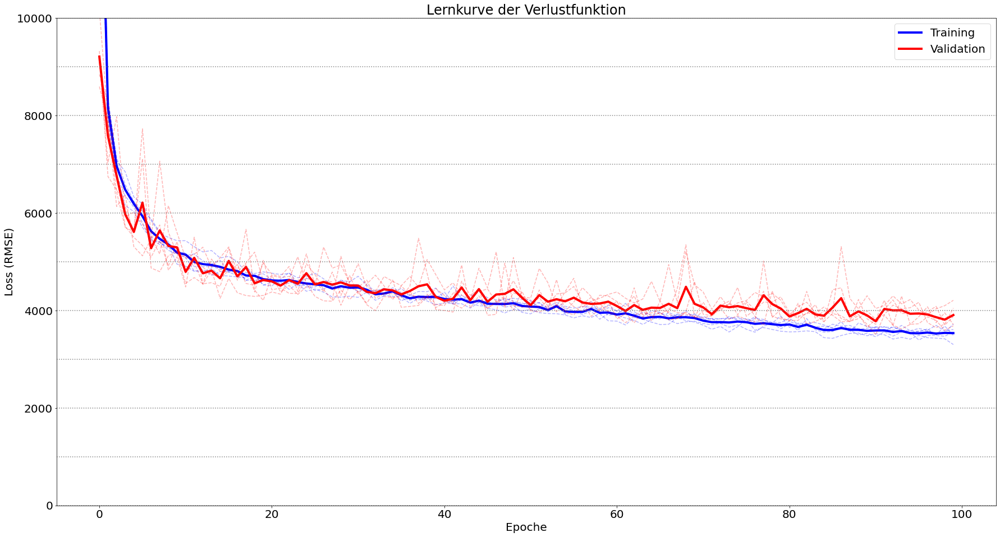

In [5]:
#Training auswerten (Metriken und Lernkurve)
functions.evaluate_training(df_metrics, df_history, 10000)

<font size="5">
Das Modell erreicht einen MAPE von 1,94% auf den Testdaten und ist damit etwas besser als die während der Kreuzvalidierung erstellten Modelle. Der Unterschied ist allerdings sehr gering und kann vermutlich auf die größere Datenbasis beim finalen Test zurückgeführt werden. Auf den Trainingsdaten wird ein MAPE von 1,37% erreicht, hier zeigt sich also immer noch die leichte Überanpassung, die in der Lernkurve ab etwa der 60. Epoche einsetzt. Die Überanpassung ist allerdings gering ausgeprägt und lässt sich nicht weiter kompensieren. Sie wird daher akzeptiert. Restriktionen und Vorbehalte bezüglich des Trainings und der hier erzielten Ergebnisse sind in der Ausarbeitung zu finden.
</font>


### <font size="5">Test</font>

In [10]:
#Finales Modell erstellen
model = model_creation()

#Finales Modell trainieren
history = model.fit(x=X_train, y=y_train, epochs=epochs, batch_size=batch_size, use_multiprocessing=True)

Epoch 1/100
273/273 [==============================] - 3s 7ms/step - loss: 0.1061
Epoch 2/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0577
Epoch 3/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0514
Epoch 4/100
273/273 [==============================] - 2s 7ms/step - loss: 0.0471
Epoch 5/100
273/273 [==============================] - 2s 8ms/step - loss: 0.0455
Epoch 6/100
273/273 [==============================] - 2s 7ms/step - loss: 0.0443
Epoch 7/100
273/273 [==============================] - 2s 7ms/step - loss: 0.0416
Epoch 8/100
273/273 [==============================] - 2s 7ms/step - loss: 0.0403
Epoch 9/100
273/273 [==============================] - 2s 7ms/step - loss: 0.0396
Epoch 10/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0383
Epoch 11/100
273/273 [==============================] - 2s 6ms/step - loss: 0.0382
Epoch 12/100
273/273 [==============================] - 2s 7ms/step - loss: 0.0371
Epoch 13/100


       Testdaten Trainingsdaten
R2          0.97           0.99
MAE       3226.0         2213.0
MSE   19654252.0     10226540.0
RMSE      4433.0         3198.0
                               
MAPE      1.94 %         1.37 %


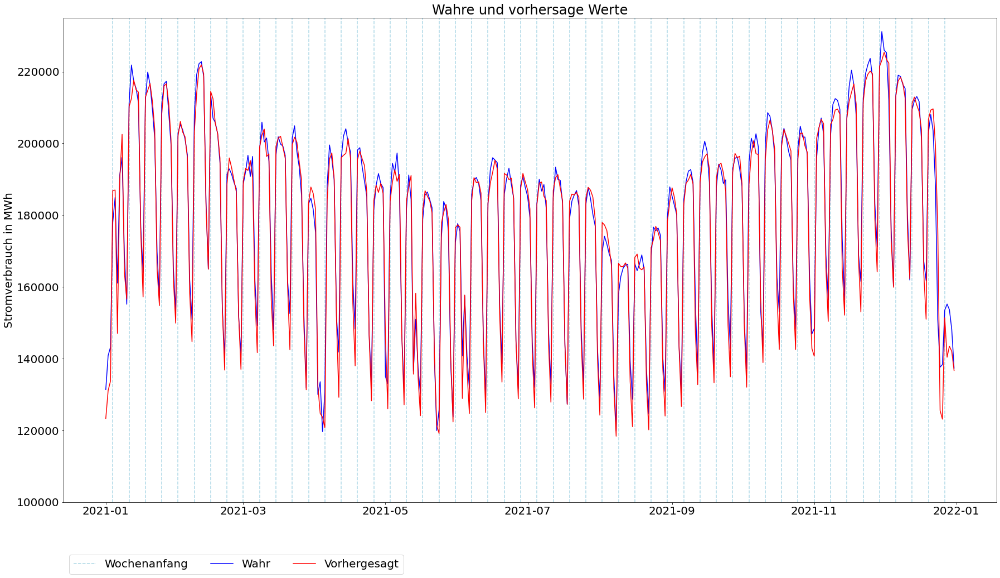

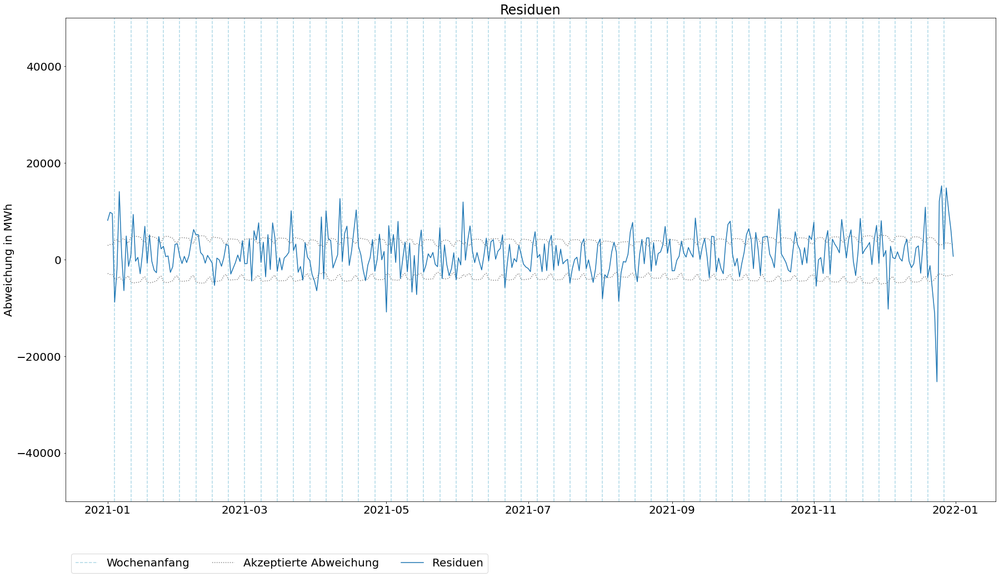

In [10]:
## Vorhersagen erzeugen
scaled_preds_test = model.predict(X_test)
scaled_preds_train = model.predict(X_train)

functions.custom_metrics_lstm(y_test_true, scaled_preds_test, y_train_true, scaled_preds_train)

In [ ]:
model.save("Modelle/LSTM.h5"),

#from tensorflow.keras.models import load_model
#newmodel = load_model("Modelle/LSTM.h5", custom_objects={"root_mean_squared_error":root_mean_squared_error})
#newmodel.summary()